
### <center>Procesamiento Digital de Señales de Audio</center>
#### <center>Instituto de Ingeniería Eléctrica - UdelaR</center>
# Hoja de Ejercicios 1 - Curso 2024
## Introducción al procesamiento de señales de audio.
### Procesamiento de audio en el dominio del tiempo - Percepción auditiva.

## Pautas para el práctico
 - La realización del presente trabajo es individual.
 - Se espera la entrega de un PDF escrito en $\LaTeX$ o similar. El mismo tendrá:
     - Máximo de 12 páginas
     - Máximo de 2500 palabras
 - También se espera la entrega del código escrito, en scripts Python o en este mismo Jupyter Notebook.
 - La corrección del práctico se hará sobre lo entregado en el PDF, pero podremos apoyarnos en el razonamiento y comprensión demostrado en el código escrito. Recomendamos escribir el código de forma prolija para facilitar la comprensión presente y futura tanto de nosotros como de ustedes. Exhortamos comentar el código para su mejor comprensión.


**Nombre de el/la estudiante: Silvina Datz**

### Como correr este notebook

Es posible descargarlo y correrlo localmente en su computadora

Tambien pueden correrlo en Google Colab usando el siguiente link.

<table align="center">
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/mrocamora/audio-dsp/blob/main/practicos/AudioDSP_Practico_1.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Correr en Google Colab</a>
  </td>
</table>

In [2]:
# Al correr esta celda, se podrá acceder a archivos
# y carpetas en su cuenta de google drive.
# Puede ver la estructura de carpetas apretando en|
# el icono de carpeta de la barra lateral izquierda.
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# Puede ser de utilidad definir una ruta relativa a los archivos a utilizar
dir_files = '/content/drive/MyDrive/Audio/práctico1_audiodsp/Archivos_P1/'

In [1]:
dir_files = "./Archivos_P1/"

## Ejercicio 1
**Digitalización. Sampling, aliasing. Cuantización. Dithering.**

Este ejercicio tiene como objetivo estudiar el muestreo y la cuantización de señales de audio.

### Parte 1 - Sampling / Aliasing

1. Abrir el archivo *tones.wav* (muestreado a $44100Hz$), que contiene un tono de $6000Hz$ seguido de otro tono de $2000Hz$. Se sugiere utilizar las bibliotecas *scikits.audiolab* o [scipy.io](https://docs.scipy.org/doc/scipy/reference/io.html). Re-muestrear esta señal a $22050Hz$ y a $11025Hz$. Realizarlo de dos formas: descartando una de cada dos muestras y utilizando la función *decimate* de la biblioteca [scipy.signal](https://docs.scipy.org/doc/scipy/reference/signal.html).  Estudiar los resultados, escuchando los archivos de audio obtenidos y mediante espectrogramas. Se recomienda utilizar la función *specgram* de *matplotlib* o *spectrogram* de *scipy*.

1. Repetir para el archivo *chirp.wav*. Comentar los resultados.

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import io, signal
from scipy.io.wavfile import read
from IPython.display import Audio

# Ejemplo de abrir y escuchar un archivo de audio
# deben adaptar el path al directorio donde se
# encuentran las pistas en su Drive.

sr, data = io.wavfile.read(dir_files+'tones.wav')
Audio(data, rate=sr)



1.

In [3]:
from scipy.signal import decimate

data_22050_descartando = data[::2]
data_11025_descartando = data[::4]

data_22050_decimate = decimate(data, 2)
data_11025_decimate = decimate(data, 4)

In [4]:
print("Remuestreo a 22050k descartando 1 de cada 2 muestras")
Audio(data_22050_descartando, rate=22050)

Remuestreo a 22050k descartando 1 de cada 2 muestras


In [5]:
print("Remuestreo a 22050k usando decimate(2)")
Audio(data_22050_decimate, rate=22050)

Remuestreo a 22050k usando decimate(2)


In [6]:
print("Remuestreo a 11025k descartando 1 de cada 4 muestras")
Audio(data_11025_descartando, rate=11025)

Remuestreo a 11025k descartando 1 de cada 4 muestras


In [7]:
print("Remuestreo a 11025k usando decimate(4)")
Audio(data_11025_decimate, rate=11025)

Remuestreo a 11025k usando decimate(4)


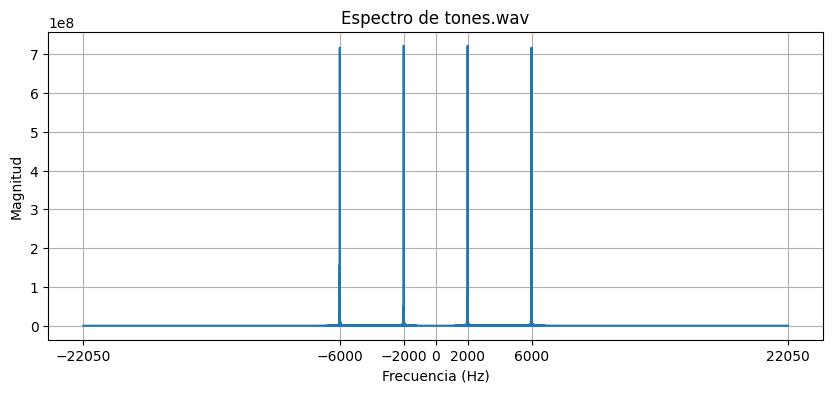

In [8]:
from numpy.fft import fft, fftfreq, fftshift

sr = 44100
N = len(data)

# FFT
X = fft(data)
X_mag = fftshift(np.abs(X))
freqs = fftshift(fftfreq(N, 1/sr))

# Graficar el espectro
plt.figure(figsize=(10, 4))
plt.plot(freqs, X_mag)
plt.title('Espectro de tones.wav')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Magnitud')
plt.grid(True)
plt.xticks(np.arange(min(freqs), max(freqs), 2000))
plt.xticks([-sr/2, -6000, -2000, 0, 2000, 6000, sr/2])
plt.show()

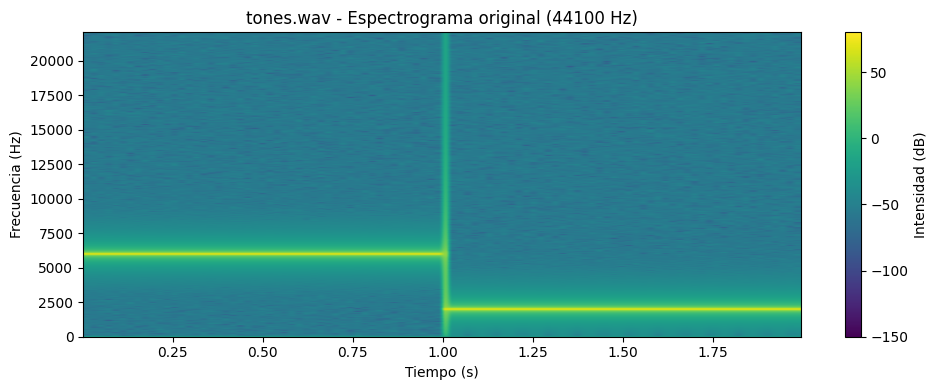

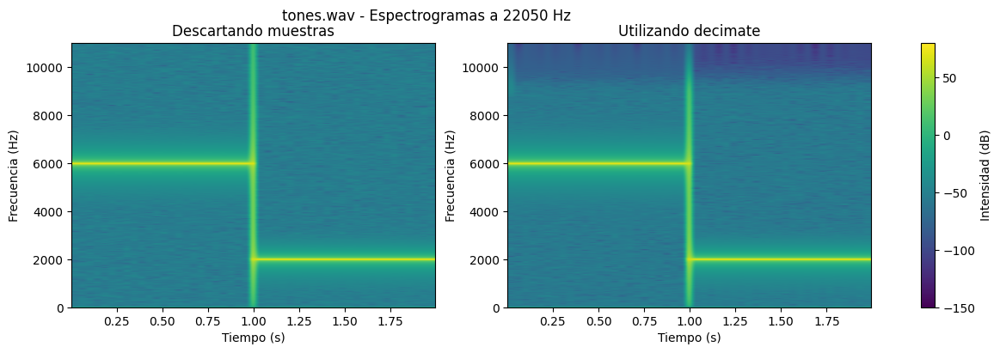

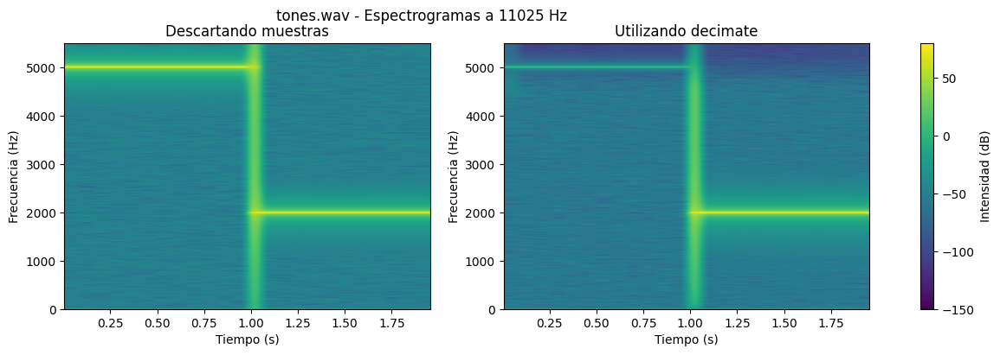

In [9]:

# Función para crear espectrogramas
def plot_spectrogram(ax, data, sr, title, vmin, vmax):
    spec, freqs, t, im = ax.specgram(data, Fs=sr, NFFT=1024, vmin=vmin, vmax=vmax)
    ax.set_title(title)
    ax.set_xlabel('Tiempo (s)')
    ax.set_ylabel('Frecuencia (Hz)')
    return im

vmin, vmax = -150, 80

# Figura 1: Espectrograma original
plt.figure(figsize=(10, 4))
ax = plt.gca()
im = plot_spectrogram(ax, data, sr, 'tones.wav - Espectrograma original (44100 Hz)', vmin, vmax)
plt.colorbar(im, label='Intensidad (dB)')
plt.tight_layout()
plt.show()

# Figura 2: Espectrogramas a 22050 Hz
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 4))
im1 = plot_spectrogram(ax1, data_22050_descartando, 22050, 'Descartando muestras', vmin, vmax)
im2 = plot_spectrogram(ax2, data_22050_decimate, 22050, 'Utilizando decimate', vmin, vmax)
plt.colorbar(im1, ax=[ax1, ax2], label='Intensidad (dB)')
plt.suptitle('tones.wav - Espectrogramas a 22050 Hz', x=0.4)
plt.show()

# Figura 3: Espectrogramas a 11025 Hz
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 4))
im1 = plot_spectrogram(ax1, data_11025_descartando, 11025, 'Descartando muestras', vmin, vmax)
im2 = plot_spectrogram(ax2, data_11025_decimate, 11025, 'Utilizando decimate', vmin, vmax)
plt.colorbar(im1, ax=[ax1, ax2], label='Intensidad (dB)')
plt.suptitle('tones.wav - Espectrogramas a 11025 Hz', x=0.4)
plt.show()

La señal de audio tones.wav contiene dos tonos, a 2kHz y 6Hz, por lo tanto se puede ver en el espectro dos deltas en dichas frencuencias. La señal tiene como frecuencia máxima $f_{max}=6kHz$, por lo tanto, aplicando el Teorema de Muestreo se sabe que para poder reconstriur la señal de manera exacta a partir de sus muestras es necesario realizar un muestreo de al menos $2 f_{max}$, es decir, de al menos 12kHz.

En el ejercicio se pide muestrar la señal a 22500Hz y a 11025Hz, por consecuencia, se puede afirmar que en el primer caso se podrá recuperar la señal a partir de sus muestras de manera precisa, mientras que en el segundo caso no.

La diferencia entre muestrar simplemente descartando muestras y utilizando la función decimate() de la bibloteca scipy.signal es que esta última aplica un filtro antialiasing como paso previo al muestreo. Dicha diferencia se puede apreciar en el caso en que no se cumplen las hipótesis del teorema de muestreo, cuando se muestrea a $f_s= 11025Hz$, donde en el caso en que se descartan las muestras se genera aliasing mientras que utilizando el decimate() se pierde el espectro a partir de $f_s/2 = 5512.5Hz$ (en particular se pierde el tono a 6kHz) pero no se produce solapamiento espectral.

2.

In [10]:
sr, data = io.wavfile.read(dir_files+'chirp.wav')

data_22050_descartando = data[::2]
data_11025_descartando = data[::4]

data_22050_decimate = decimate(data, 2)
data_11025_decimate = decimate(data, 4)

In [11]:
print("Audio original")
Audio(data, rate=sr)

Audio original


In [12]:
print("Remuestreo a 22050k descartando 1 de cada 2 muestras")
Audio(data_22050_descartando, rate=22050)

Remuestreo a 22050k descartando 1 de cada 2 muestras


In [13]:
print("Remuestreo a 22050k usando decimate(2)")
Audio(data_22050_decimate, rate=22050)

Remuestreo a 22050k usando decimate(2)


In [14]:
print("Remuestreo a 11025k descartando 1 de cada 4 muestras")
Audio(data_11025_descartando, rate=11025)

Remuestreo a 11025k descartando 1 de cada 4 muestras


In [15]:
print("Remuestreo a 11025k usando decimate(4)")
Audio(data_11025_decimate, rate=11025)

Remuestreo a 11025k usando decimate(4)


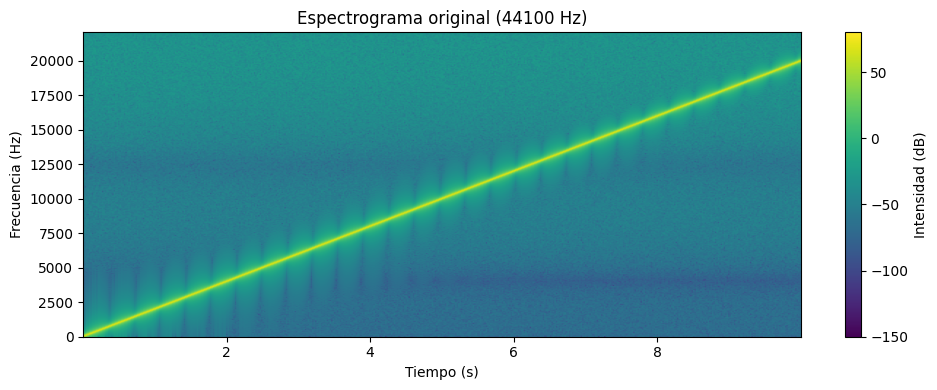

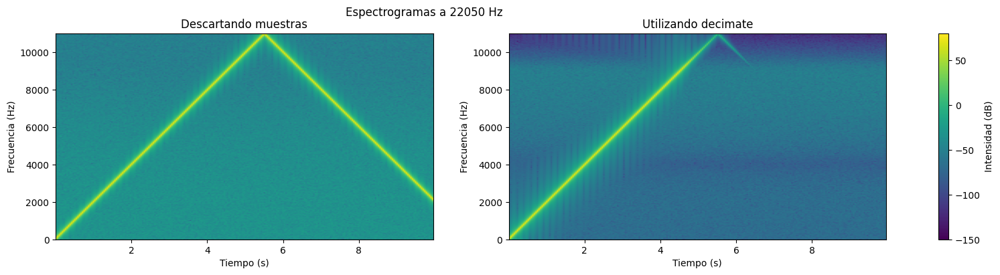

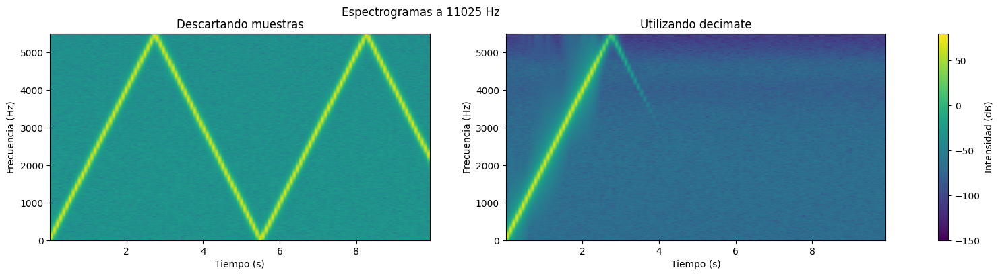

In [16]:
# Función para crear espectrogramas
def plot_spectrogram(ax, data, sr, title, vmin, vmax):
    spec, freqs, t, im = ax.specgram(data, Fs=sr, NFFT=1024, vmin=vmin, vmax=vmax)
    ax.set_title(title)
    ax.set_xlabel('Tiempo (s)')
    ax.set_ylabel('Frecuencia (Hz)')
    return im

vmin, vmax = -150, 80

# Figura 1: Espectrograma original
plt.figure(figsize=(10, 4))
ax = plt.gca()
im = plot_spectrogram(ax, data, sr, 'Espectrograma original (44100 Hz)', vmin, vmax)
plt.colorbar(im, label='Intensidad (dB)')
plt.tight_layout()
plt.show()

# Figura 2: Espectrogramas a 22050 Hz
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 4))
im1 = plot_spectrogram(ax1, data_22050_descartando, 22050, 'Descartando muestras', vmin, vmax)
im2 = plot_spectrogram(ax2, data_22050_decimate, 22050, 'Utilizando decimate', vmin, vmax)
plt.colorbar(im1, ax=[ax1, ax2], label='Intensidad (dB)')
plt.suptitle('Espectrogramas a 22050 Hz', x=0.4)
plt.show()

# Figura 3: Espectrogramas a 11025 Hz
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 4))
im1 = plot_spectrogram(ax1, data_11025_descartando, 11025, 'Descartando muestras', vmin, vmax)
im2 = plot_spectrogram(ax2, data_11025_decimate, 11025, 'Utilizando decimate', vmin, vmax)
plt.colorbar(im1, ax=[ax1, ax2], label='Intensidad (dB)')
plt.suptitle('Espectrogramas a 11025 Hz', x=0.4)
plt.show()

### Parte 2 - Quantization / Dithering

1. Asumiendo el error de cuantización uniforme y con distribución $\mathcal{U}(-\frac{Q}{2},\frac{Q}{2})$, deduzca la expresión de la relación señal a ruido (*signal-to-error ratio*) para un sistema de $n$ bits de largo de palabra. ¿Cuántos decibeles se reduce el error de cuantización al aumentar $2$ bits el largo de palabra?
1. **Deducir la expresión de la potencia del ruido de cuantización** al agregar **_dithering de distribución triangular_** en el sistema. Considerar dithering con la distribucion de probabilidad de la figura 2.

_Nota_: las potencias del dithering de distribución rectangular y normal, representadas en la figura 2, son las siguientes respectivamente:
$$
\begin{cases}
			P_{D~unif} =\frac{Q^2}{12}\\
      P_{D~Gauss} =\frac{Q^2}{4}\\
\end{cases}
$$
---

<img src="https://drive.google.com/uc?id=1eLJhdlVPEl2r5tT2PkBeLCRcto5cWmbJ" alt="FIG 1">

`FIG 1: Señal sinusoidal de frecuencia \unit[2000]{Hz} y amplitud $2$.`

---

---
<img src="https://drive.google.com/uc?id=1RjvPvWYthAp4-new0PYVFeJn8eCvueSm" alt="FIG 2">

`FIG 2: Distribuciones de probabilidad de los tipos de dithering. La distribución gaussiana es`
$\mathcal{N}(0, \frac{Q^2}{4})$

---

1.

Para n bits, tenemos $2^n$ niveles de cuantización, entonces el paso de cuantización es $Q = \frac{2A}{2^n}$, siendo A la amplitud de pico máxima que alcanza la señal.

Si el error de cuantización N se distribuye uniformemente en [-Q/2, Q/2], la varianza del error de cuantización es $\sigma_{N}^2 = \frac{Q^2}{12}=\frac{A^2}{3*2^{2n}}$. Luego tenemos que la potencia del error de cuantización es $P_N=E[N^2(t)] = \sigma_{N}^2 = \frac{A^2}{3*2^{2n}}$.

Por otro lado, la potencia media de una señal sinusoidal $X(t)=A \sin(2πft+ϕ)$ es $P_X=A^2/2$

Para calcular la SNR debemos ver el cociente entre la potencia de la señal y la potencia del ruido.

$SNR=\frac{P_X}{P_N} = \frac{3}{2}2^{2n}$

$SNR_{dB}=10\log(SNR) = 10\log(\frac{3}{2}2^{2n})=10\log(\frac{3}{2})+20nlog(2) =  1.7609 + 6.0206 n$


Por cómo queda la expresión de la SNR, aumentar 2 bits implica que la SNR aumenta 12.041dB. Por otro lado, tenemos que $SNR_{dB}={P_X}_{dB} - {P_N}_{dB}$, por lo que aumentar 12.041dB la SNR equivale a decir que el **error de cuantización disminuye 12.041dB**.


2.

El ruido de cuantización triangular que se ve en la Figura tiene distribucion
$f(x) = \begin{cases}
\frac{1}{Q} \left(1 - \frac{|x|}{Q}\right) & \text{para } -Q \leq x \leq Q \\
0 & \text{en otro caso}
\end{cases}$

Por la simetría de la distribución se sabe que tiene media nula $E[N]=0$
La potencia se puede calcular entonces como:

$$
P_N = E[N^2] = \int_{-\infty}^{\infty}x^2 f(x)dx = \int_{-Q}^{Q}x^2 \frac{1}{Q} \left(1 - \frac{|x|}{Q}\right) dx = \frac{2}{Q} \int_{0}^{Q} x^2 \left(1 - \frac{x}{Q}\right) dx = \frac{2}{Q} \left( \int_{0}^{Q} x^2 dx - \frac{1}{Q} \int_{0}^{Q} x^3 dx \right)
$$

$$
= \frac{2}{Q} \left(  \left[\frac{x^3}{3}\right]_{0}^{Q} - \frac{1}{Q} \left[\frac{x^4}{4}\right]_{0}^{Q} \right) = \frac{2}{Q} \left(  \frac{Q^3}{3} - \frac{1}{Q} \frac{Q^4}{4} \right) =2Q^2 \left( \frac{1}{3} - \frac{1}{4} \right) =2Q^2 \cdot \frac{1}{12} = \frac{Q^2}{6}
$$


3. Se desea analizar el efecto de la cuantización y el uso de dithering para una señal de baja amplitud. Se utilizará una señal sinusoidal de frecuencia $440Hz$ y amplitud $2$, muestreada a $f_s=44100Hz$ (figura 1). Para simular que esta señal tiene baja amplitud con respecto al rango de la cuantización, considerar el paso de cuantización igual a $1$.

	Se pide:
	1. Generar la señal sinusoidal (unos pocos segundos).
	1. Sumar a la señal tres tipos de dithering; uniforme, triangular y gaussiano, utilizando las distribuciones de probabilidad de la figura 2.
	1. Cuantizar la señal sin dithering, y las señales con los distintos tipos de dithering.
	1. Calcular la potencia del error de cuantización y graficar el espectro de la señal cuantizada en cada caso.
	1. Analizar los resultados de manera gráfica y perceptual (auditiva). Comparar.


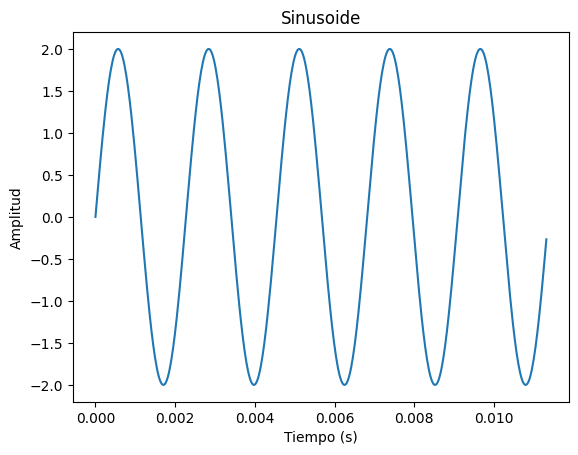

In [17]:
### 1) Generar señal sinusoidal

# parametros
amplitud = 2
frecuencia = 440

# vector de tiempos
t = np.arange(0, 3, 1/44100)
# otra opcion
t = np.linspace(0, 3, (3-0)*44100)
sinusoide = amplitud * np.sin(2*np.pi * frecuencia * t)

# grafica de parte de la sinusoide
plt.plot(t[:500], sinusoide[:500])
plt.title("Sinusoide")
plt.ylabel('Amplitud'), plt.xlabel('Tiempo (s)')

plt.show()

# reproducir audio
Audio(sinusoide, rate=44100)

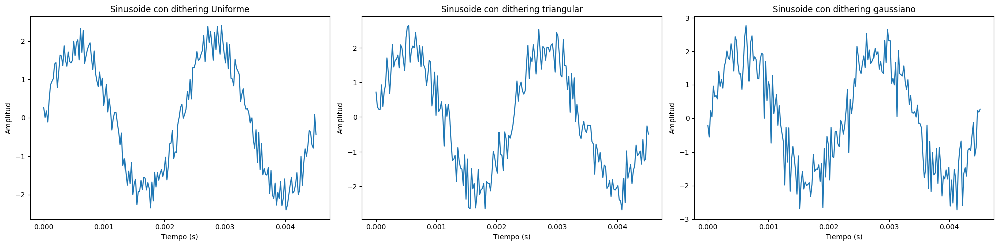

In [18]:
# 2) Agregar dithering

# parametros
Q = 1

# dithering
uniform_noise = np.random.uniform(low=-Q/2, high=Q/2, size=len(sinusoide))
triangular_noise = np.random.triangular(left=-Q, mode=0, right=Q, size=len(sinusoide))
gaussian_noise = np.random.normal(loc=0, scale=np.sqrt((Q**2)/4), size=len(sinusoide))

# señal + dithering
sinusoide_uniforme = sinusoide  + uniform_noise
sinusoide_triangular = sinusoide  + triangular_noise
sinusoide_gaussiano = sinusoide  + gaussian_noise

# Graficar señales con dithering
fig, ax = plt.subplots(1, 3, figsize=(20, 5))

ax[0].plot(t[:200], sinusoide_uniforme[:200])
ax[0].set_title("Sinusoide con dithering Uniforme")
ax[0].set_ylabel('Amplitud')
ax[0].set_xlabel('Tiempo (s)')

ax[1].plot(t[:200], sinusoide_triangular[:200])
ax[1].set_title("Sinusoide con dithering triangular")
ax[1].set_ylabel('Amplitud')
ax[1].set_xlabel('Tiempo (s)')

ax[2].plot(t[:200], sinusoide_gaussiano[:200])
ax[2].set_title("Sinusoide con dithering gaussiano")
ax[2].set_ylabel('Amplitud')
ax[2].set_xlabel('Tiempo (s)')

plt.tight_layout()
plt.show()

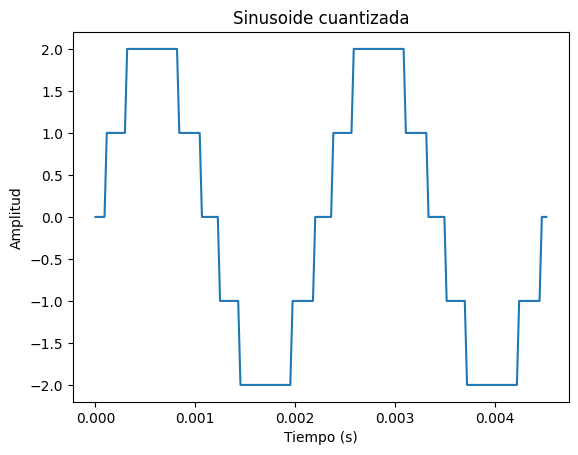

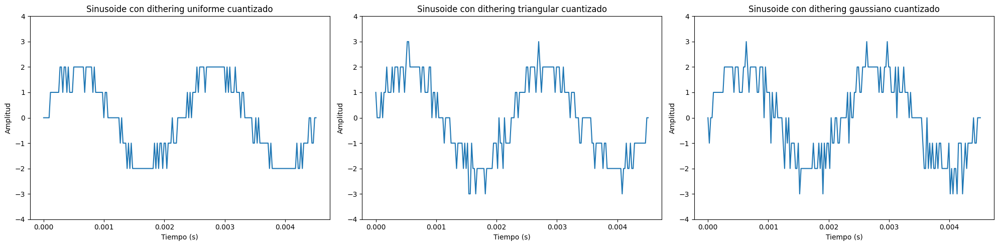

In [19]:
# 3) Cuantización

def cuantizar(x, Q):
  """
  Cuantiza la señal de entrada x con un paso de cuantización Q.

  Parámetros:
    x (array-like): Señal de entrada a cuantizar.
    Q : (float): Paso de cuantización.

  Retorno:
    quantized_x (array-like): Señal cuantizada.
  """

  quantized_x = Q * np.round(x / Q)

  return quantized_x

# Cuantizar las señales
sinusoide_cuantizada = cuantizar(sinusoide, Q)
sinusoide_uniforme_cuantizada = cuantizar(sinusoide_uniforme, Q)
sinusoide_triangular_cuantizada = cuantizar(sinusoide_triangular, Q)
sinusoide_gaussiano_cuantizada = cuantizar(sinusoide_gaussiano, Q)

# Graficar señales cuantizadas

plt.figure()
plt.plot(t[:200], sinusoide_cuantizada [:200])
plt.title("Sinusoide cuantizada")
plt.ylabel('Amplitud')
plt.xlabel('Tiempo (s)')
# plt.ylim(-3,3)
plt.show()

fig, ax = plt.subplots(1, 3, figsize=(20, 5))

ax[0].plot(t[:200], sinusoide_uniforme_cuantizada[:200])
ax[0].set_title("Sinusoide con dithering uniforme cuantizado")
ax[0].set_ylabel('Amplitud')
ax[0].set_xlabel('Tiempo (s)')
ax[0].set_ylim(-4, 4)

ax[1].plot(t[:200], sinusoide_triangular_cuantizada[:200])
ax[1].set_title("Sinusoide con dithering triangular cuantizado")
ax[1].set_ylabel('Amplitud')
ax[1].set_xlabel('Tiempo (s)')
ax[1].set_ylim(-4, 4)

ax[2].plot(t[:200], sinusoide_gaussiano_cuantizada[:200])
ax[2].set_title("Sinusoide con dithering gaussiano cuantizado")
ax[2].set_ylabel('Amplitud')
ax[2].set_xlabel('Tiempo (s)')
ax[2].set_ylim(-4, 4)

plt.tight_layout()
plt.show()

/tmp/ipykernel_21272/1076929988.py:11: RuntimeWarning: divide by zero encountered in log10
  magnitude_db = 10 * np.log10(np.abs(fft_vals))


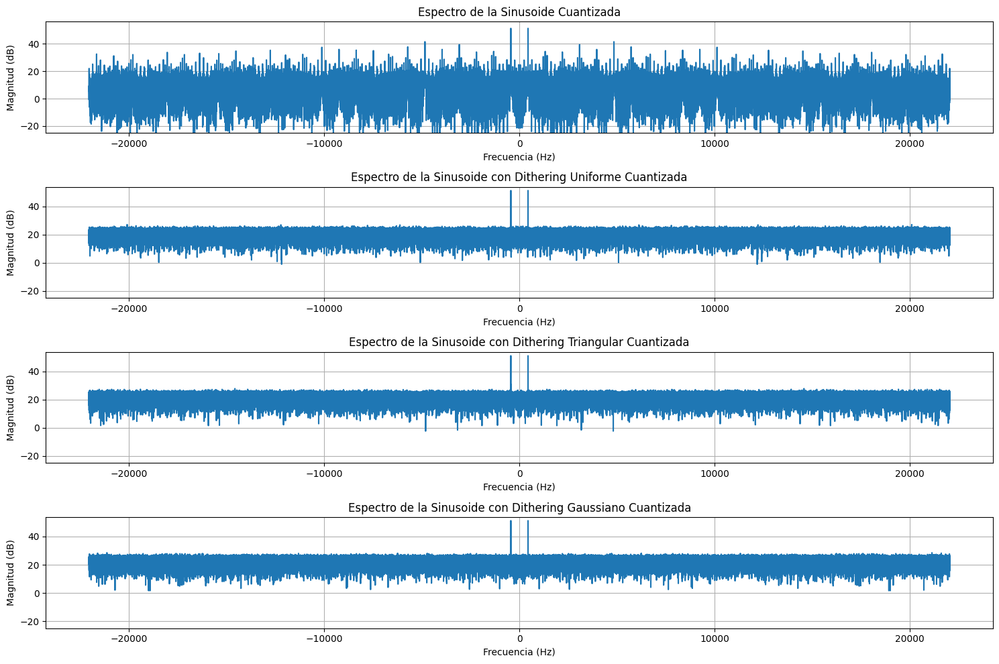

In [20]:
# 4) Graficar el espectro de la señal cuantizada

fs = 44100

def graficar_espectro(signal, title):
    N = len(signal)
    fft_vals = fftshift(fft(signal))
    fft_freqs = fftshift(fftfreq(N, 1/fs))

    # Convertir a dB
    magnitude_db = 10 * np.log10(np.abs(fft_vals))

    plt.plot(fft_freqs, magnitude_db)
    plt.title(title)
    plt.ylabel('Magnitud (dB)')
    plt.xlabel('Frecuencia (Hz)')
    plt.grid(True)
    plt.ylim(bottom=-25)

plt.figure(figsize=(15, 10))

plt.subplot(4, 1, 1)
graficar_espectro(sinusoide_cuantizada, "Espectro de la Sinusoide Cuantizada")

plt.subplot(4, 1, 2)
graficar_espectro(sinusoide_uniforme_cuantizada, "Espectro de la Sinusoide con Dithering Uniforme Cuantizada")

plt.subplot(4, 1, 3)
graficar_espectro(sinusoide_triangular_cuantizada, "Espectro de la Sinusoide con Dithering Triangular Cuantizada")

plt.subplot(4, 1, 4)
graficar_espectro(sinusoide_gaussiano_cuantizada, "Espectro de la Sinusoide con Dithering Gaussiano Cuantizada")

plt.tight_layout()
plt.show()

La potencia de una señal discreta es la suma de los cuadrados absolutos de sus muestras de dominio de tiempo dividida entre la longitud de la señal.

A continuacion se calcula la potencia del error de cuantizacion en cada caso

In [21]:
N = len(sinusoide)

pot_sin_cuantizada = np.sum(np.abs(sinusoide_cuantizada - sinusoide)**2) / N
pot_uniforme_cuantizada = np.sum(np.abs(sinusoide_uniforme_cuantizada - sinusoide)**2) / N
pot_triangular_cuantizada = np.sum(np.abs(sinusoide_triangular_cuantizada - sinusoide)**2) / N
pot_gaussiano_cuantizada = np.sum(np.abs(sinusoide_gaussiano_cuantizada - sinusoide)**2) / N

print("Potencia error de cuantizaion sin dithering:            ", pot_sin_cuantizada)
print("Potencia error de cuantizaion con dithering uniforme:   ", pot_uniforme_cuantizada)
print("Potencia error de cuantizaion con dithering triangular: ", pot_triangular_cuantizada)
print("Potencia error de cuantizaion con dithering gaussiano:  ", pot_gaussiano_cuantizada)

Potencia error de cuantizaion sin dithering:             0.06950359149644925
Potencia error de cuantizaion con dithering uniforme:    0.14483322893556028
Potencia error de cuantizaion con dithering triangular:  0.25026827063687107
Potencia error de cuantizaion con dithering gaussiano:   0.3318833963375524


El aumento de la potencia del error de cuantización al aplicar dithering se debe al ruido añadido, pero este ruido rompe la correlación entre el error y la señal, lo que reduce las distorsiones armónicas. Esto se refleja en el espectro de la señal cuantizada, donde se observan menos componentes espurios y una mayor calidad perceptual.

In [22]:
Audio(sinusoide_triangular_cuantizada, rate=fs)

4. **Implementar y aplicar** técnica de **_noise-shaping_**, vista en el teórico del curso, _para el caso con dither triangular_.
* Comparar el resultado tanto gráficamente (en dominio temporal y frecuencial) y en percepción auditiva con los casos sin dither y con dither.
* _Responder:_ ¿Qué particularidad tiene el espectro resultante al usar noise-shaping?

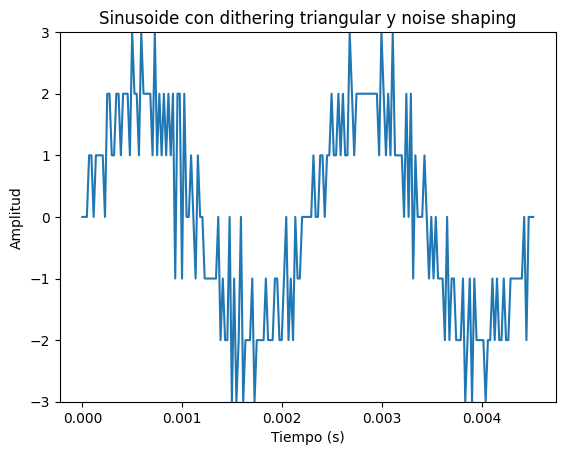

/tmp/ipykernel_21272/1076929988.py:11: RuntimeWarning: divide by zero encountered in log10
  magnitude_db = 10 * np.log10(np.abs(fft_vals))


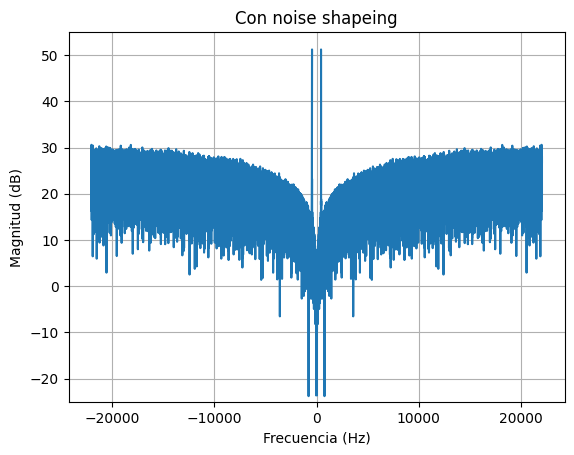

In [23]:
# 4) Implementar Noise-Shaping

def noise_shaping(x, d, Q):
    N = len(x)
    y = np.zeros(N)
    e0 = np.zeros(N)

    for n in range(1, N):
        # Calcular la entrada al cuantizador
        q_input = x[n] + d[n] - e0[n-1]

        # Cuantizar
        y[n] = cuantizar(q_input, Q)

        # Calcular e0
        e0[n] = y[n] - (x[n] - e0[n-1])

    return y

x = sinusoide
e = cuantizar(x, Q) - x
d = triangular_noise


y = noise_shaping(x, d, Q)


plt.figure()
plt.plot(t[:200], y[:200])
plt.title("Sinusoide con dithering triangular y noise shaping")
plt.ylabel('Amplitud')
plt.xlabel('Tiempo (s)')
plt.ylim(-3, 3)
plt.show()

plt.figure()
graficar_espectro(y, "Con noise shapeing")

In [24]:
print("Con noise shaping")
Audio(y, rate=fs)

Con noise shaping


Al utilizar noise-shaping se redistribuye el ruido de cuantización en el espectro, el cual se atenúa en donde la señal es más importante (bajas frecuencias) y se amplifica en frecuencias altas, reduciendo así la percepción del ruido en la banda de interés, mejorando la calidad de la señal.

## Ejercicio 2
**Short-time average energy, magnitude and zero-crossing rate.**

En este ejercicio se calculan características en tiempo corto de una señal de audio; en particular, energía, magnitud y tasa de cruces por cero.

### Parte 1

La energía y la magnitud en tiempo corto de una señal $x[n]$, $E_n$ y $M_n$ respectivamente, se definen como:

\begin{equation*}
\begin{array}{rcl}
	E_n & = & \displaystyle\sum_{m=-\infty}^{\infty}x^2[m]w[n-m] \\
	M_n & = & \displaystyle\sum_{m=-\infty}^{\infty}|x[m]|w[n-m]
\end{array}
\end{equation*}

donde $w[n]$ es una ventana de análisis temporal. Se pide:

1. Para la ventana $w_a[n]$, encontrar las expresiones en recurrencia para calcular $E_n$ y $M_n$ en función de $E_{n-1}$ y $M_{n-1}$ respectivamente.

\begin{equation*}
	w_a[n]=
		\begin{cases}
			a^n, & n \geq 0 \\
			0, & n < 0.
	\end{cases}
\end{equation*}

2. Para la ventana rectangular $w_R[n]$, escribir funciones que implementen el cálculo de $E_n$ y $M_n$.

\begin{equation*}
	w_R[n]=
		\begin{cases}
			1, & 0 \leq n \leq N-1 \\
			0, & \text{en otro caso}.
		\end{cases}
\end{equation*}

3. Utilizando estas funciones, calcular y graficar $E_n$ y $M_n$ para la señal de audio del archivo _ejemplo_palabras.wav_. ¿Es posible determinar el inicio y final de las palabras aisladas utilizando estas medidas?

1.

$E_n = \sum_{m=-\infty}^{\infty} x^2[m] \omega[n-m] = \sum_{m=-\infty}^{n} x^2(m) a^{n-m} = \left( \sum_{m=-\infty}^{n-1} x^2[m] a^{n-m} \right) + x^2[n]$


$E_{n-1} = \sum_{m=-\infty}^{\infty} x^2[m] \omega[n-1-m] = \sum_{m=-\infty}^{n-1} x^2[m] a^{n-1-m} = \frac{1}{a} \sum_{m=-\infty}^{n-1} x^2[m] a^{n-m}$


$\Rightarrow \boxed{E_n = a E_{n-1} + x^2[n]}$

$M_n = \sum_{m=-\infty}^{\infty} |x[m]| \omega[n-m] = \sum_{m=-\infty}^{n} |x[m]| a^{n-m} = \left( \sum_{m=-\infty}^{n-1} |x[m]| a^{n-m} \right) + |x[n]|$


$M_{n-1} = \sum_{m=-\infty}^{\infty} |x[m]| \omega[n-1-m] = \sum_{m=-\infty}^{n-1} |x[m]| a^{n-1-m} = \frac{1}{a} \sum_{m=-\infty}^{n-1} |x[m]| a^{n-m}$

$\Rightarrow \boxed{M_n = a M_{n-1} + |x[n]|}$




2.

In [25]:
def calcular_energia(x, N):
  """
  Calcula la energía en tiempo corto E_n de la señal x[n] usando una ventana rectangular de longitud N.

  Parámetros:
    x (array-like): Señal de entrada.
    N (int): Longitud de la ventana de análisis.

  Retorno:
    E_n (array-like): Vector de energía en tiempo corto.
  """
  w_R = np.ones(N)
  E_n = np.convolve(x**2, w_R, mode='same')
  return E_n

def calcular_M_n(x, N):
  """
  Calcula la magnitud en tiempo corto M_n de la señal x[n] usando una ventana rectangular de longitud N.
  Parámetros:
    x (array-like): Señal de entrada.
    N (int): Longitud de la ventana de análisis.

  Retorno:
    M_n (array-like): Vector de magnitud en tiempo corto.
  """
  w_R = np.ones(N)
  x_abs = np.abs(x)
  M_n = np.convolve(x_abs, w_R, mode='same')
  return M_n

3.

In [26]:
sr, data = io.wavfile.read(dir_files+'ejemplo_palabras.wav')
Audio(data, rate=sr)

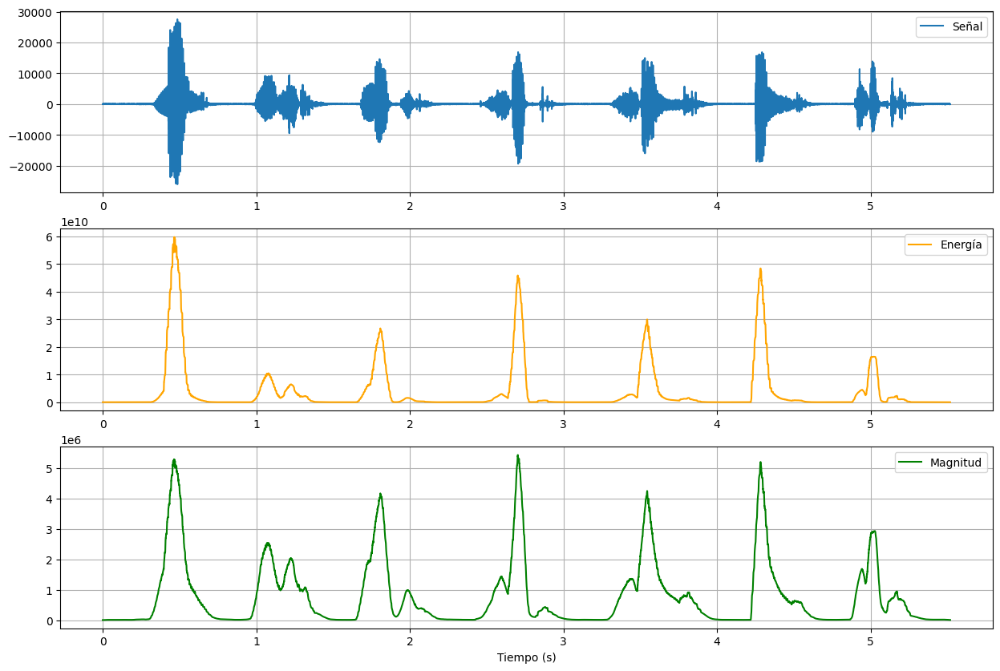

In [27]:
energia = calcular_energia(data.astype('int64'), N=1024)
magnitud = calcular_M_n(data, N=1024)

fig, ax = plt.subplots(3, 1, figsize=(15, 10))
ax[0].plot(np.linspace(0, len(data)/sr, len(data)), data, label='Señal')
ax[0].grid()
ax[0].legend()

ax[1].plot(np.linspace(0, len(data)/sr, len(data)), energia, label='Energía', color='orange')
ax[1].legend()
ax[1].grid()

ax[2].plot(np.linspace(0, len(data)/sr, len(data)), magnitud, label='Magnitud', color='green')
ax[2].set_xlabel('Tiempo (s)')
ax[2].legend()
ax[2].grid()

plt.show()

### Parte 2

La tasa de cruces por cero es una forma simple de estimar el contenido espectral de una señal, sobre todo para señales de banda angosta. Matemáticamente puede definirse como

\begin{equation*}
	Z_n = \displaystyle\sum_{m=-\infty}^{\infty}|\text{sign}(x[m])-\text{sign}(x[m-1])|\ w[n-m]
\end{equation*}

donde \;
$\text{sign}(x[m]) = \begin{cases} 1, & x[m]\geq0 \\ -1, & x[m]<0. \end{cases}$ \;
y \;
$w[n] = \begin{cases} \frac{1}{2N}, & 0\leq n\leq N-1 \\ 0, & \text{en otro caso} \end{cases}$

Se pide:
1. Demostrar que $Z_n$ puede expresarse de forma recursiva como

  \begin{equation*}
        Z_n = Z_{n-1} + \frac{1}{2N}\left\{ |\text{sign}(x[n]) - \text{sign}(x[n-1])| - |\text{sign}(x[n-N]) - \text{sign}(x[n-N-1])| \right\}.
  \end{equation*}
  _Sugerencia:_ Calcular la diferencia $Z_n - Z_{n-1}$ para llegar a la expresión deseada.

2. Implementar una función que calcule la tasa de cruces por cero para $N$ muestras de una señal.

3. Calcular y graficar la tasa de cruces por cero para la señal de audio del archivo *ejemplo_palabras.wav*, cada $10ms$. ¿Esta medida aporta información para encontrar los inicios y finales de las palabras?

1.

$$\begin{align*}
Z_n  &= \displaystyle\sum_{m=-\infty}^{\infty}|\text{sign}(x[m])-\text{sign}(x[m-1])|\ w[n-m]  \\
&= \displaystyle\sum_{m=n-N+1}^{n}|\text{sign}(x[m])-\text{sign}(x[m-1])|\  \\
Z_{n-1}  &= \displaystyle\sum_{m=-\infty}^{\infty}|\text{sign}(x[m])-\text{sign}(x[m-1])|\ w[n-1-m] \\
&= \displaystyle\sum_{m=n-N}^{n-1}|\text{sign}(x[m])-\text{sign}(x[m-1])|\  \\
Z_n - Z_{n-1} &=  \displaystyle\sum_{m=n-N+1}^{n}|\text{sign}(x[m])-\text{sign}(x[m-1])|\ -  \displaystyle\sum_{m=n-N}^{n-1}|\text{sign}(x[m])-\text{sign}(x[m-1])|\\\
&=  \frac{1}{2N}\left\{ |\text{sign}(x[n]) - \text{sign}(x[n-1])| - |\text{sign}(x[n-N]) - \text{sign}(x[n-N-1])| \right\}\\
Z_n  &= Z_{n-1} + \frac{1}{2N}\left\{ |\text{sign}(x[n]) - \text{sign}(x[n-1])| - |\text{sign}(x[n-N]) - \text{sign}(x[n-N-1])| \right\}\\
\end{align*}$$

2.

In [28]:
def tasa_cruces_cero(x, N):
  """
  Calcula la tasa de cruces por cero en tiempo corto Z_n de la señal x[n] usando una ventana rectangular de longitud N.

  Parámetros:
    x (array-like): Señal de entrada.
    N (int): Longitud de la ventana de análisis.

  Retorno:
    Z_n (array-like): Vector de tasa de cruces por cero en tiempo corto.
  """

  Z = np.zeros(len(x))

  for n in range(1, N):
      Z[n] += Z[n-1] + (1/(2*N)) * (np.abs(np.sign(x[n]) - np.sign(x[n-1])))

  for n in range(N, Z.shape[0]):
      Z[n] = Z[n-1] + (1/(2*N)) * (np.abs(np.sign(x[n]) - np.sign(x[n-1])) - np.abs(np.sign(x[n-N]) - np.sign(x[n-N-1])))

  return Z

3.

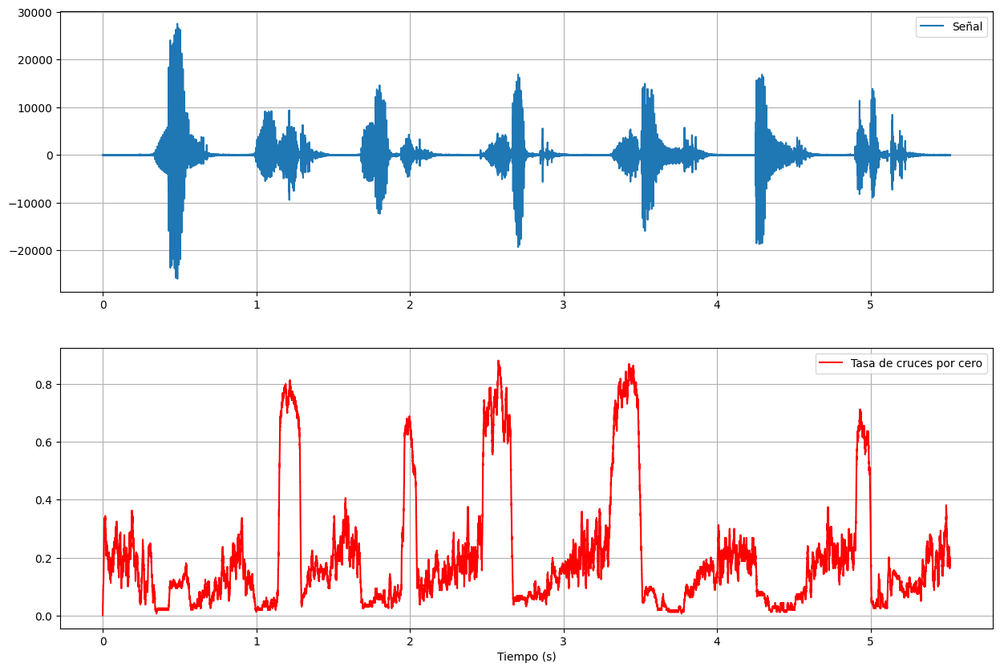

In [29]:
Z = tasa_cruces_cero(data, N=int(sr*0.010)) # sr*0.010 es la cantidad de muestras en 10ms

fig, ax = plt.subplots(2, 1, figsize=(15, 10))
ax[0].plot(np.linspace(0, len(data)/sr, len(data)), data, label='Señal')
ax[0].grid()
ax[0].legend()

ax[1].plot(np.linspace(0, len(Z)/sr, len(Z)), Z, label='Tasa de cruces por cero', color='red')
ax[1].set_xlabel('Tiempo (s)')
ax[1].legend()
ax[1].grid()

### Parte 3

El problema de encontrar el inicio y final de palabras es importante en muchas aplicaciones de procesamiento de señales de voz. Una manera simple de abordar este problema es utilizando la energía en tiempo corto y la tasa de cruces por cero en tiempo corto.

Se pide:

1. Implementar un algoritmo que encuentre automáticamente el inicio y final de las palabras, utilizando las funciones escritas en las partes anteriores (energía y tasa de cruces por cero).
1. Probar el algoritmo con las señales de los archivos *ejemplo_palabras.wav*, *voice2.wav* y *fox.wav*.
1. Comentar los resultados obtenidos, incluyendo las posibles limitantes del abordaje.

In [30]:
def detectar_inicio_y_fin(data, umbral_energia, umbral_cruces):
    E = calcular_energia(data.astype('int64'), N=1024)
    Z = tasa_cruces_cero(data-np.mean(data), N=int(sr*0.010))

    E_max = np.max(E)
    Z_max = np.max(Z)

    Y = np.zeros(data.shape[0])
    for i in range(Z.shape[0]):
        if E[i]/E_max > umbral_energia or Z[i]/Z_max > umbral_cruces:
            Y[i] = 1

    return Y

In [31]:
sr1, data1 = io.wavfile.read(dir_files+'ejemplo_palabras.wav')
sr2, data2 = io.wavfile.read(dir_files+'voice2.wav')
sr3, data3 = io.wavfile.read(dir_files+'fox.wav')

In [32]:
Audio(data1, rate=sr1)

In [33]:
Audio(data2, rate=sr2)

In [34]:
Audio(data3, rate=sr3)

In [35]:
def plotear_analisis_de_voz(data, sr, umbral_energia, umbral_cruces):
  E = calcular_energia(data.astype('int64'), N=1024)
  Z = tasa_cruces_cero(data, N=int(sr*0.010))
  Y = detectar_inicio_y_fin(data, umbral_energia, umbral_cruces)

  fig, ax = plt.subplots(2, 1, figsize=(15, 8))

  ax[0].plot(np.linspace(0, len(data)/sr, len(data)), data/np.max(data), label='Señal', color='skyblue')
  ax[0].plot(np.linspace(0, len(E)/sr, len(E)), E/np.max(E), label='Energía normalizada', color='red')
  ax[0].hlines(umbral_energia, 0, len(data)/sr, linestyles='dashed', color='red', label='Umbral energía')
  ax[0].plot(np.linspace(0, len(Z)/sr, len(Z)), Z/np.max(Z), label='Tasa de cruces por cero normalizada', color='green')
  ax[0].hlines(umbral_cruces, 0, len(data)/sr, linestyles='dashed', color='green', label='Umbral tasa de cruces por cero')
  ax[0].grid()
  ax[0].legend(loc='lower right')

  ax[1].plot(np.linspace(0, len(data)/sr, len(data)), data/np.max(data), label='Señal', color='skyblue')
  ax[1].plot(np.linspace(0, len(Y)/sr, len(Y)), Y, label='Detector de palabra', color='black')
  ax[1].legend()
  ax[1].set_xlabel('Tiempo (s)')
  ax[1].grid()

  plt.show()

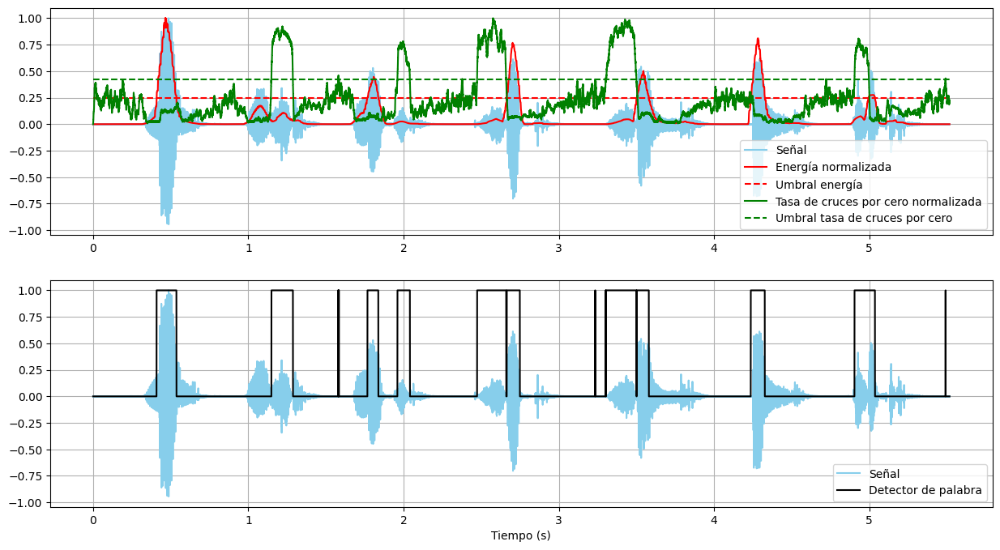

In [36]:
plotear_analisis_de_voz(data1, sr1, umbral_energia=0.25, umbral_cruces=0.42)


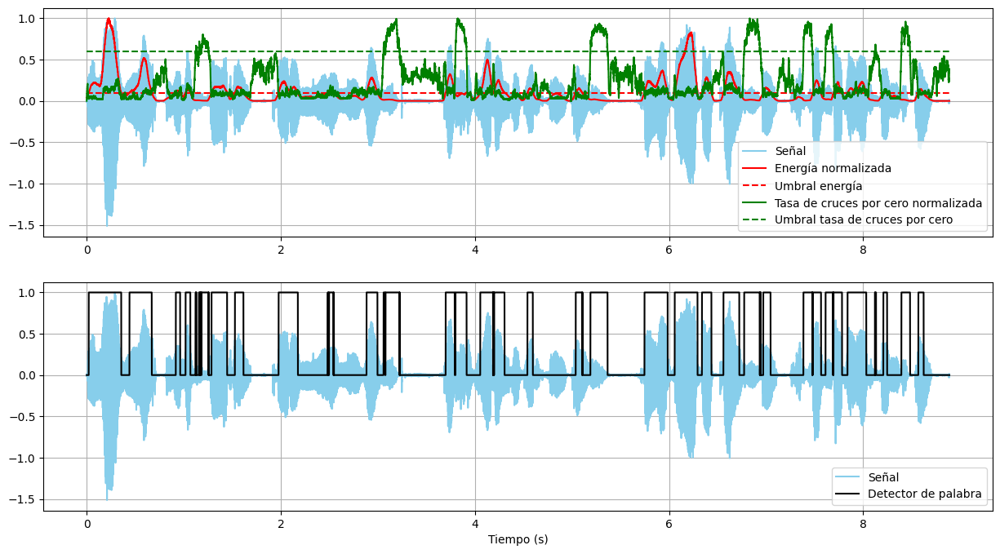

In [37]:
plotear_analisis_de_voz(data2, sr2, umbral_energia=0.1, umbral_cruces=0.6)

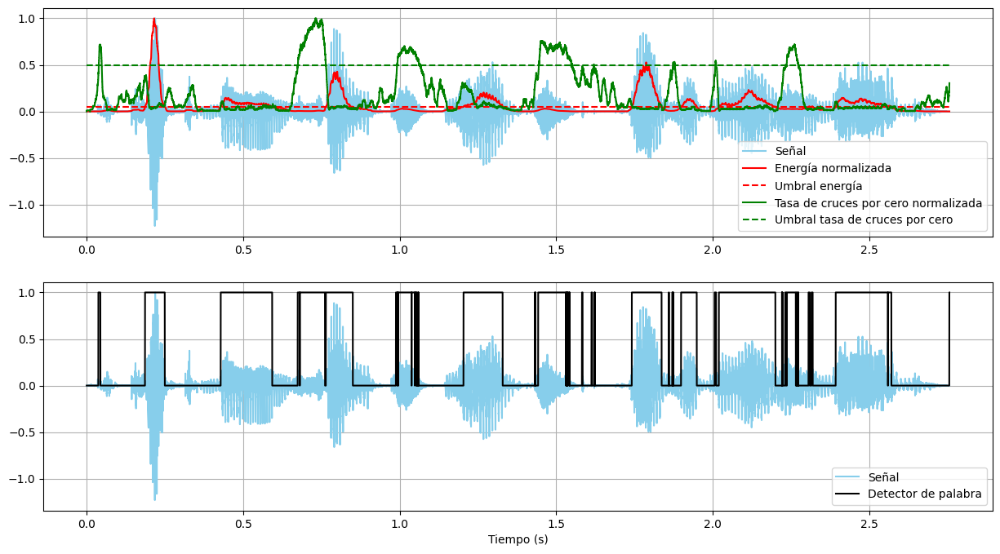

In [38]:
plotear_analisis_de_voz(data3, sr3, umbral_energia=0.05, umbral_cruces=0.5)

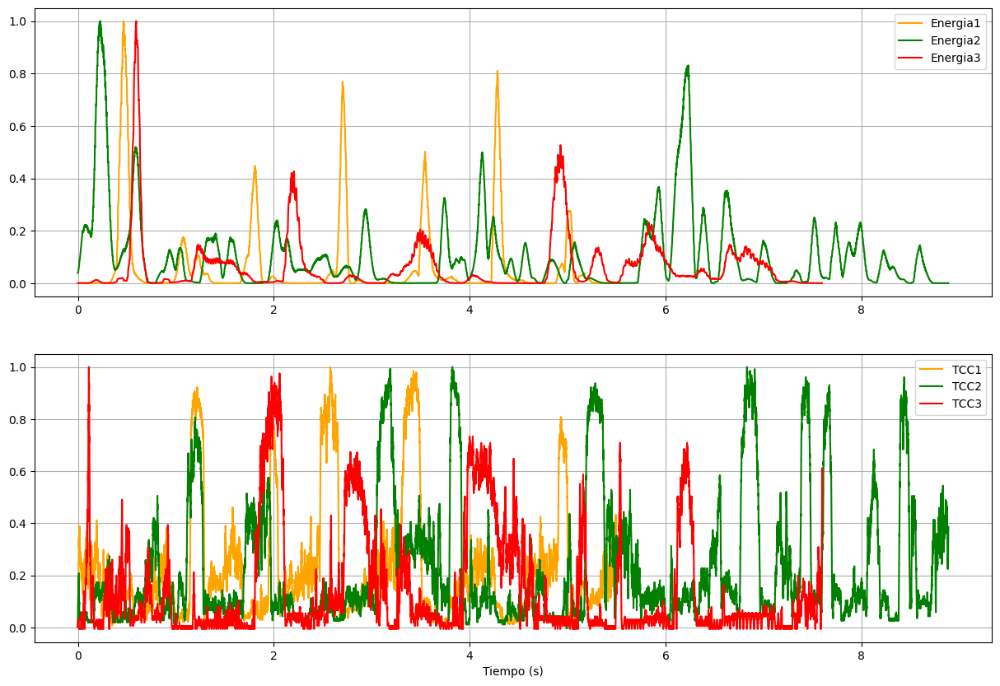

In [39]:
E1 = calcular_energia(data1.astype('int64'), N=1024)
E2 = calcular_energia(data2.astype('int64'), N=1024)
E3 = calcular_energia(data3.astype('int64'), N=1024)

Z1 = tasa_cruces_cero(data1, N=int(sr*0.010))
Z2 = tasa_cruces_cero(data2, N=int(sr*0.010))
Z3 = tasa_cruces_cero(data3, N=int(sr*0.010))

fig, ax = plt.subplots(2, 1, figsize=(15, 10))
ax[0].plot(np.linspace(0, len(data1)/sr, len(data1)), E1/np.max(E1), label='Energia1', color='orange')
ax[0].plot(np.linspace(0, len(data2)/sr, len(data2)), E2/np.max(E2), label='Energia2', color='green')
ax[0].plot(np.linspace(0, len(data3)/sr, len(data3)), E3/np.max(E3), label='Energia3', color='red')
ax[0].grid()
ax[0].legend()

ax[1].plot(np.linspace(0, len(Z1)/sr, len(Z1)), Z1/np.max(Z1), label='TCC1', color='orange')
ax[1].plot(np.linspace(0, len(Z2)/sr, len(Z2)), Z2/np.max(Z2), label='TCC2', color='green')
ax[1].plot(np.linspace(0, len(Z3)/sr, len(Z3)), Z3/np.max(Z3), label='TCC3', color='red')
ax[1].set_xlabel('Tiempo (s)')
ax[1].legend()
ax[1].grid()
plt.show()

Vocales tienen mucha energia

Consonantes tiene muchos cruces por cero

## Ejercicio 3
**Short-time autocorrelation function, short-time AMDF and pitch estimation.**

En este ejercicio se presenta el cálculo de la función de autocorrelación, y su aplicación en el cálculo de la frecuencia fundamental de una señal de audio.

### Parte 1

La función de autocorrelación en tiempo corto está definida como
\begin{equation*}
	R_n[k] = \displaystyle\sum_{m=-\infty}^{\infty}x[m]w[n-m]x[m+k]w[n-k-m].
\end{equation*}

1. Demostrar que $R_n[k]$ es una función par en $k$, o sea, que $R_n[k] = R_n[-k]$.
1. Demostrar que $R_n[k]$ puede escribirse como
\begin{equation*}
	R_n[k] = \displaystyle\sum_{m=-\infty}^{\infty}x[m]x[m-k]h_k[n-m]
\end{equation*}
donde $h_k[n] = w[n]w[n+k]$.

1.

$$\begin{align*}
    R_n[k] &=  \displaystyle\sum_{m=-\infty}^{\infty}x[m]w[n-m]x[m+k]w[n-k-m]\\
    R_n[-k]&=  \displaystyle\sum_{m=-\infty}^{\infty}x[m]w[n-m]x[m-k]w[n+k-m]\\
    \text{Cambio de variable: } m' &= m-k \\
    &=  \displaystyle\sum_{m'=-\infty}^{\infty}x[m'+k]w[n-(m'+k)]x[m']w[n-m'] \\
    &=  R_n[k] \\
\end{align*}$$



2.

$$\begin{align*}
    R_n[k] &=  R_n[-k] \\
    &=  \displaystyle\sum_{m=-\infty}^{\infty}x[m]w[n-m]x[m-k]w[n+k-m]\\
    &=  \displaystyle\sum_{m=-\infty}^{\infty}x[m]x[m-k]w[n-m]w[n-m+k]\\
    &=  \displaystyle\sum_{m=-\infty}^{\infty}x[m]x[m-k]h_k[n-m] \\
\end{align*}$$




### Parte 2

Se utilizará ahora la función de autocorrelación para implementar la detección de frecuencia fundamental de señales de audio. Se sugiere el siguiente procedimiento:
1. Se toman intervalos de $30ms$ de largo, cada $10ms$ (i.e. $20ms$ de superposición).
1. Para cada intervalo:
	1. Se calculan los primeros $250$ valores de la función de autocorrelación (Se sugiere una implementación vectorial).
	1. Se busca el índice $k_f$ del primer máximo local que supere el $60\%$ del valor en cero. Si existe, hay un componente periódico suficientemente notorio, cuya frecuencia es $f = \frac{f_s}{k_f}$.
	1. Si no se encuentra ningún máximo local bajo esa condición, se asigna $f = 0$, considerándose que no hay un componente periódico relevante en ese intervalo de tiempo.
	1. Se obtiene un vector con valores de frecuencia cada $10ms$ comenzando en $t=0.015s$.

Realizar este procedimiento utilizando la señal de audio del archivo *LP-mem-6-a.wav*. Comparar los resultados con la referencia contenida en el archivo *LP-mem-6-a.txt*.

_Sugerencia:_ puede ser de utilidad un post-procesado de la frecuencia fundamental obtenida para suavizar y/o eliminar detecciones espúreas.



In [40]:
sr, data = io.wavfile.read(dir_files+'LP-mem-6-a.wav')
Audio(data, rate=sr)

In [41]:
def autocorrelacion(x, K):
    N = len(x)
    R = np.zeros(K)

    for k in range(K):
        R[k] = np.sum(x[k:N] * x[:N-k]) / N

    return R

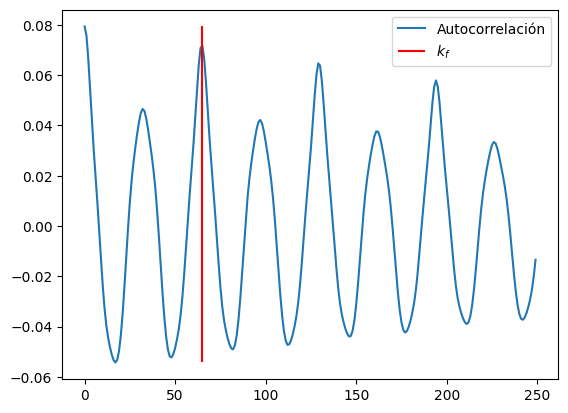

In [42]:
from scipy.signal import find_peaks, medfilt

def frecuencia_fundamental(x, fs, win_size, hop_size, median=False, debug=False):
    L = x.shape[0]

    win_samp = round(win_size*fs) # window size in samples
    hop_samp = round(hop_size*fs) # hop size in samples

    num_frames = int((L-win_samp)/hop_samp) # number of frames to process
    f0 = np.zeros(num_frames)

    # compute maximum value for each signal frame
    for i in range(num_frames):

        # frame's initial index
        ind_ini = i*hop_samp

        # frame's ending index
        ind_end = ind_ini+win_samp

        # signal frame
        frame = x[ind_ini:ind_end]

        # compute autocorrelation
        r = autocorrelacion(frame, 250)

        # find first peak above 60% of the maximum value
        f0[i] = 0
        indices_maximos, _ = find_peaks(r)
        for k in sorted(indices_maximos):
            if r[k] > 0.6*r[0] and k > 40: # Se descartan frecuencias fundamentales mayores a 600Hz (k>40)
                f0[i] = fs/k
                break

        if debug and i == 1001:
            plt.figure()
            plt.plot(r, label='Autocorrelación')
            if f0[i] != 0:
                plt.vlines(fs/f0[i], min(r), max(r), colors='r', label='$k_f$')
            plt.legend()

    if median:
        f0 = medfilt(f0, kernel_size=11)

    return f0

f0 = frecuencia_fundamental(x=data/max(data), fs=sr, win_size=0.030, hop_size=0.010, debug=True, median=True)


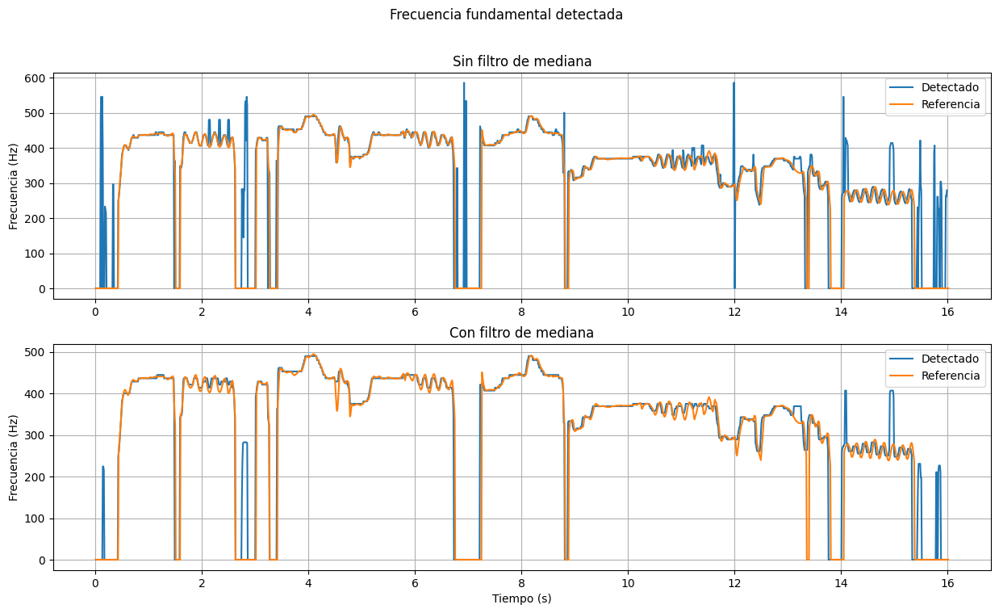

In [43]:
# Comparar con la referencia
ref_data = np.loadtxt(dir_files+'LP-mem-6-a.txt')

fig, ax = plt.subplots(2, 1, figsize=(15, 8))
plt.suptitle('Frecuencia fundamental detectada')

f0 = frecuencia_fundamental(x=data/max(data), fs=sr, win_size=0.030, hop_size=0.010, median=False)
t = np.arange(len(f0)) * 0.01 + 0.015
ax[0].plot(t, f0, label='Detectado')
ax[0].plot(ref_data[:, 0], ref_data[:, 1], label='Referencia')
ax[0].set_ylabel('Frecuencia (Hz)')
ax[0].legend()
ax[0].set_title('Sin filtro de mediana')
ax[0].grid(True)

f0 = frecuencia_fundamental(x=data/max(data), fs=sr, win_size=0.030, hop_size=0.010, median=True)
ax[1].plot(t, f0, label='Detectado')
ax[1].plot(ref_data[:, 0], ref_data[:, 1], label='Referencia')
ax[1].set_ylabel('Frecuencia (Hz)')
ax[1].set_xlabel('Tiempo (s)')
ax[1].set_title('Con filtro de mediana')
ax[1].legend()
ax[1].grid(True)

plt.show()




### Parte 3 (opcional)

En esta parte opcional se busca agregarle dinámica temporal a la señal estimada de la frecuencia fundamental o $f_0$. De esta manera se puede conseguir una versión más "vocal" y similar de la voz cantada en el audio original.

Para ello se proponen los siguientes pasos:
1. Capturar la envolvente temporal de la forma de onda con alguna implementación vista en el curso (_máximo, energía, magnitud, etc_).
1. Sintenizar una sinusoide con frecuencia instantánea $f_0(t)$.
1. Modular la señal sintetizada con la envolvente estimada.
1. Comparar gráficamente en el dominio del tiempo la señal original con la estimación dinámica obtenida.